<a href="https://colab.research.google.com/github/KaleemNeha/CIND.820_Capstone.Research.Project/blob/main/Research_Paper_EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [24]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [25]:
# Importing Necessary Libraries
import os
import math
import sys
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
!pip install ydata-profiling
!pip install sweetviz
import sweetviz as sv

In [26]:
# Path to your folder in Google Drive
base_path = '/content/drive/MyDrive/CIND 820 - Capstone Project/'

# List all files in the folder
print(os.listdir(base_path))

['stores.csv', 'features.csv', 'test.csv', 'train.csv', 'Research Paper - EDA.ipynb', 'Reports']


In [27]:
# Loading the datasets
features = pd.read_csv(base_path + 'features.csv')
stores = pd.read_csv(base_path + 'stores.csv')
test = pd.read_csv(base_path + 'test.csv')
train = pd.read_csv(base_path + 'train.csv')

# Displaying the first few rows of each dataset
print("Features Dataset:")
print(features.head())

print("\nStores Dataset:")
print(stores.head())

print("\nTest Dataset:")
print(test.head())

print("\nTrain Dataset:")
print(train.head())


Features Dataset:
   Store        Date  Temperature  Fuel_Price  MarkDown1  MarkDown2  \
0      1  2010-02-05        42.31       2.572        NaN        NaN   
1      1  2010-02-12        38.51       2.548        NaN        NaN   
2      1  2010-02-19        39.93       2.514        NaN        NaN   
3      1  2010-02-26        46.63       2.561        NaN        NaN   
4      1  2010-03-05        46.50       2.625        NaN        NaN   

   MarkDown3  MarkDown4  MarkDown5         CPI  Unemployment  IsHoliday  
0        NaN        NaN        NaN  211.096358         8.106      False  
1        NaN        NaN        NaN  211.242170         8.106       True  
2        NaN        NaN        NaN  211.289143         8.106      False  
3        NaN        NaN        NaN  211.319643         8.106      False  
4        NaN        NaN        NaN  211.350143         8.106      False  

Stores Dataset:
   Store Type    Size
0      1    A  151315
1      2    A  202307
2      3    B   37392
3     

In [30]:
from ydata_profiling import ProfileReport
from IPython.display import IFrame

# Merge train with features on 'Store' and 'Date'
merged_data = pd.merge(train, features, on=['Store', 'Date'], how='left')

# Merge the result with stores on 'Store'
merged_data = pd.merge(merged_data, stores, on='Store', how='left')

# Merge with test data on 'Store', 'Date', and 'Dept'
merged_data = pd.merge(merged_data, test, on=['Store', 'Date', 'Dept'], how='outer')

# Generate the YData Profiling report
profile = ProfileReport(merged_data, title="Walmart Sales Data Profiling Report")

# Display the report in the notebook
profile.to_notebook_iframe()

# Save the report as an HTML file
profile.to_file("/content/drive/My Drive/walmart_sales_profiling_report.html")


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

                                             |          | [  0%]   00:00 -> (? left)


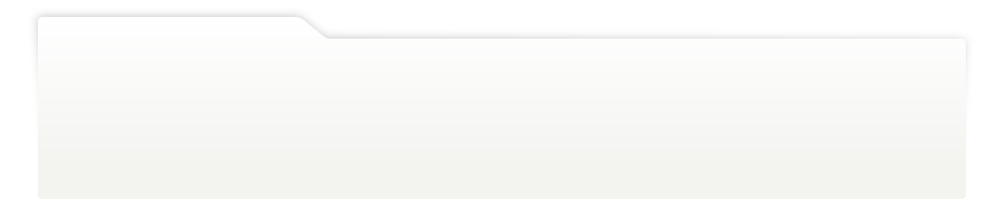
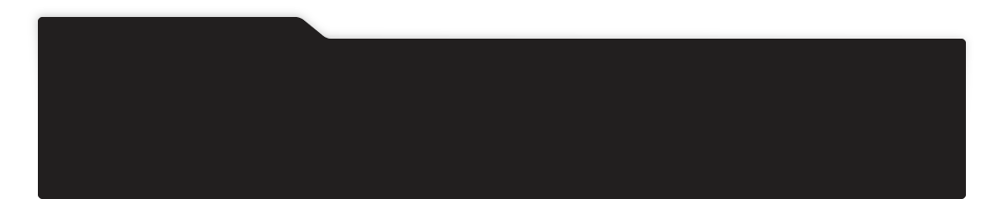
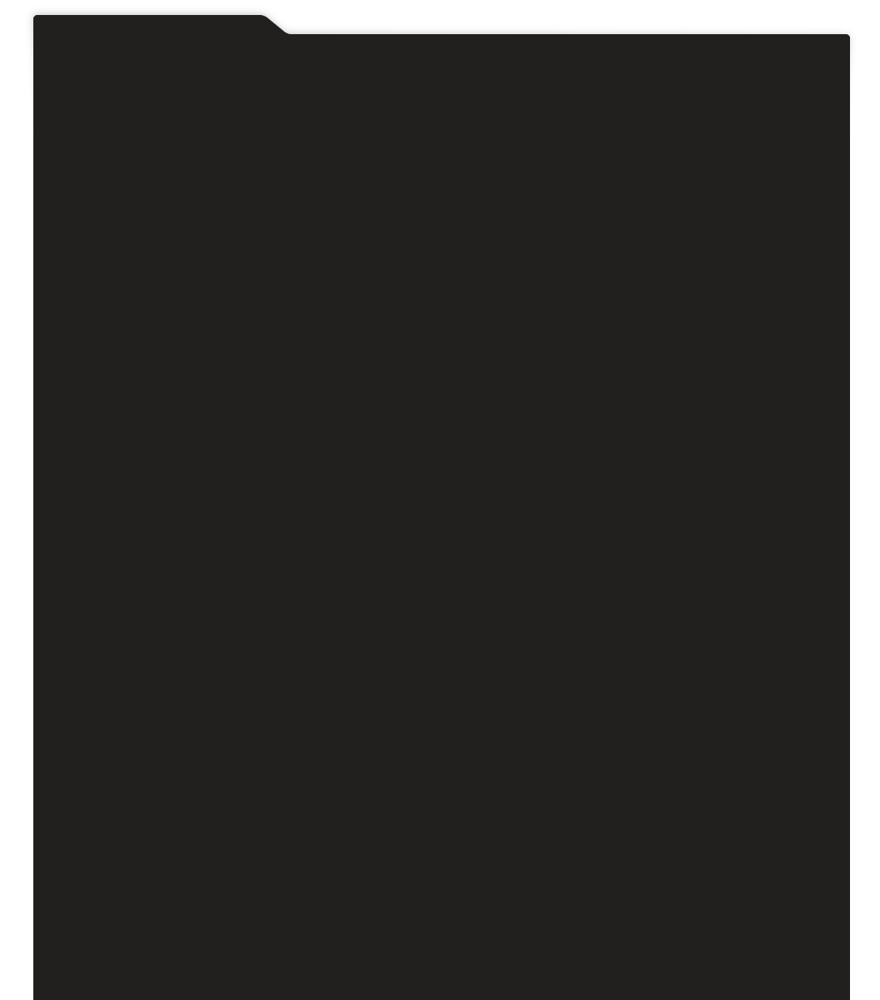
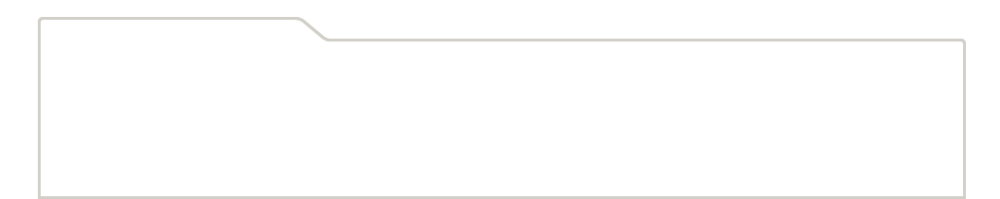
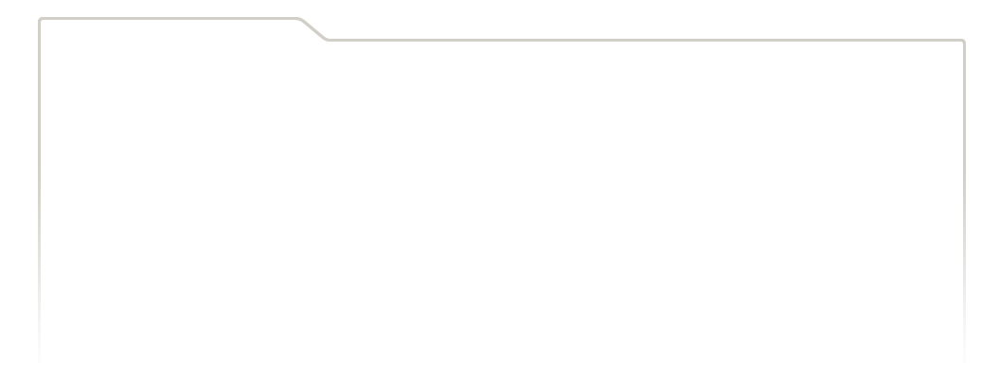
...
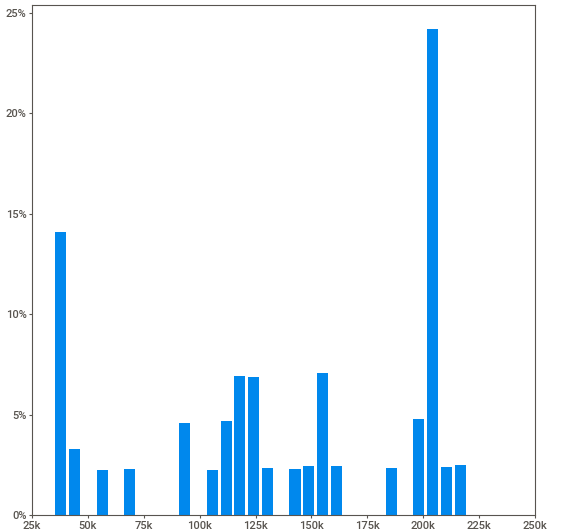
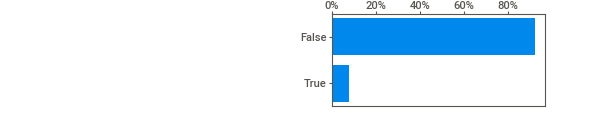
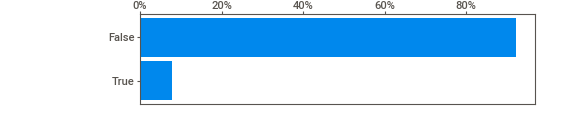
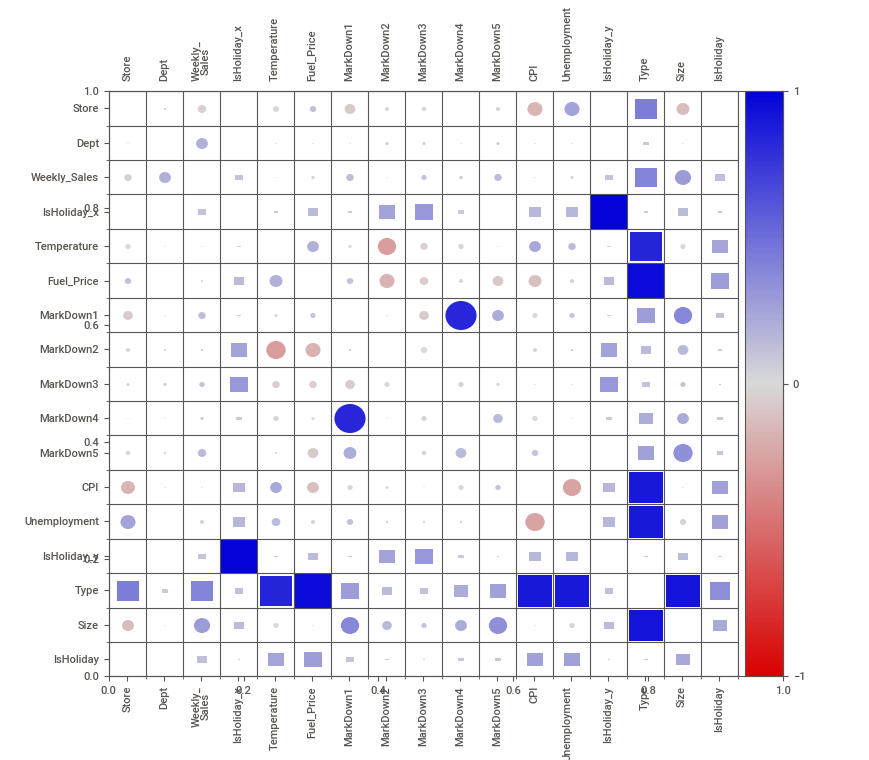
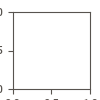

Report /content/drive/My Drive/walmart_sales_sweetviz_report.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [31]:
# Generate the EDA report
report = sv.analyze(merged_data)

# Display the report in the notebook
report.show_notebook()
report.show_html("/content/drive/My Drive/walmart_sales_sweetviz_report.html")